

<center>
    <h1><font color="red">Tutorial Exploratory Data Analysis</font></h1>
</center>

## Useful Links

- <a href="https://www.itl.nist.gov/div898/handbook/eda/eda.htm"> Exploratory Data Analysis </a> (from NIST)
- <a href="https://en.wikipedia.org/wiki/Exploratory_data_analysis">Exploratory Data Analysis</a> (from Wikipedia)
- <a href="https://www.edureka.co/blog/exploratory-data-analysis-in-python/">The Why And How Of Exploratory Data Analysis In Python</a>
- <a href="https://kite.com/blog/python/data-analysis-visualization-python/"> Exploratory Data Analysis (EDA) and Data Visualization with Python</a>
- <a href="https://datajournalism.com/read/handbook/one/understanding-data/using-data-visualization-to-find-insights-in-data">Using Data Visualization to Find Insights in Data</a>


## <font color="red">What is Exploratory Data Analysis?</font>

> Exploratory Data Analysis (EDA) is an attitude, a state of flexibility, a willingness to look for those things that we believe are not there, as well as those we believe to be there. -- John W. Tukey

EDA is an approach to analyzing data sets to summarize their main characteristics, often with visual methods.
- EDA is an important step to first understand the data (identify the trends and patterns within the data, detect outliers or anomalous events, find interesting relations among the variables, points of interest, etc.) before using them for modeling, machine learning, etc.
- By skipping this first exploratory step, data scientists might not be able to immediately understand key issues in the data or be able to guide deeper analysis in the right direction.
- The gathering of information on the data are:
    + To make sure the data is valid
    + To verify that there are no obvious problems.
- EDA employs a variety of techniques (mostly graphical) to:
    1. Maximize insight into a data set
    2. Uncover underlying structure
    3. Extract important variables
    4. Detect outliers and anomalies
    5. Test underlying assumptions
    6. Develop parsimonious models, and
    7. Determine optimal factor settings.


### <font color="blue">Some Graphical Techniques in EDA</font>

Graphical techniques employed in EDA are often quite simple, consisting of:

- Plotting the raw data:
     + <a href="https://www.itl.nist.gov/div898/handbook/eda/section3/runseqpl.htm">Data traces</a>
     + <a href="https://www.itl.nist.gov/div898/handbook/eda/section3/histogra.htm">Histograms</a>
     + <a href="https://www.itl.nist.gov/div898/handbook/eda/section3/bihistog.htm">Bihistograms</a>
     + <a href="https://www.itl.nist.gov/div898/handbook/eda/section3/probplot.htm">Probability plots</a>
     + <a href="https://www.itl.nist.gov/div898/handbook/eda/section3/lagplot.htm">Lag plots</a>
     + <a href="https://www.itl.nist.gov/div898/handbook/eda/section3/blockplo.htm">Block plots</a>
     + <a href="https://www.itl.nist.gov/div898/handbook/eda/section3/youdplot.htm">Youden plots</a>.
- Plotting simple statistics
     + <a href="https://www.itl.nist.gov/div898/handbook/eda/section3/meanplot.htm">Mean plots</a>
     + <a href="https://www.itl.nist.gov/div898/handbook/eda/section3/sdplot.htm">Standard deviation plots</a>
     + <a href="https://www.itl.nist.gov/div898/handbook/eda/section3/boxplot.htm">Box plots</a>
     + Main effects plots of the raw data.
- Positioning such plots so as to maximize our natural pattern-recognition abilities, such as using multiple plots per page.

### <font color="blue">Basic Processes of Finding Insights in Data</font>

![fig_insights](https://s3.eu-central-1.amazonaws.com/datajournalismcom/handbooks/Data-Handbook-1/using-data-visualization-to-find-insights-in-data/05-BB.png)
Image Source: Gregor Aisch

1. **Visualize the Data**
     + Use tools to have a graphical representation of the data.
2. **Analyze and Interpret**
     + What can you learn from the different visualizations?
3. **Transform the Data**:
     + Take care of missing values
     + Deal with outliers
     + Do you need to perform any dimension reduction?
4. **Document**
     + Keep track of all the generated plots and statistics in order to better understand their meanings and their unsefulness in finding insights in the available data.


### <font color="blue">Understanding the Data Types</font>

There are two basic types of structured data:

* **Numeric Data**
    - Continuous: Data can take on any value in an interval.
    - Discrete: Data can take only integer values, such as counts.
* **Categorical Data**
    - Nominal: Numbers are used simply to distinguish between different properties (for instance the marital status or the state name (Arizona, California, etc.). The numbers can only be compared but cannot be ordered.
    - Ordinal: Numerical values serve to place categories in some meaningful order (for example, Customer Satisfaction Scales)
    
The data type you have will determine the EDA graphical method to use.

## <font color="red">Goals</font>

We want to use Pandas and Seaborn to:

- Explore a numerical dataset and create visual distributions
- Identify and eliminate outliers (if any)
- Uncover correlations between two datasets


In [ ]:
%matplotlib inline
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

## <font color="red">Obtain the Dataset</font>
- We use the california housing dataset.
- Contains information about different houses in California.


#### Get the Dataset

In [ ]:
from sklearn.datasets import fetch_california_housing
housing = fetch_california_housing(as_frame=True)

In [ ]:
print("Type of the dataset: ", type(housing))

Type of the dataset:  <class 'sklearn.utils._bunch.Bunch'>


#### Basic Features of the Dataset

In [ ]:
print("Keys: ", housing.keys())

Keys:  dict_keys(['data', 'target', 'frame', 'target_names', 'feature_names', 'DESCR'])


| Dataset Key | Description |
| --- | --- |
| **data** | the data to learn |
| **target** | the regression target |
| **frame** | the frame |
| **feature_names** | the meaning of the labels |
| **DESCR** | the full description of the dataset |

Get the file name (full path):

In [ ]:
print(housing.data)

       MedInc  HouseAge  AveRooms  AveBedrms  Population  AveOccup  Latitude  \
0      8.3252      41.0  6.984127   1.023810       322.0  2.555556     37.88   
1      8.3014      21.0  6.238137   0.971880      2401.0  2.109842     37.86   
2      7.2574      52.0  8.288136   1.073446       496.0  2.802260     37.85   
3      5.6431      52.0  5.817352   1.073059       558.0  2.547945     37.85   
4      3.8462      52.0  6.281853   1.081081       565.0  2.181467     37.85   
...       ...       ...       ...        ...         ...       ...       ...   
20635  1.5603      25.0  5.045455   1.133333       845.0  2.560606     39.48   
20636  2.5568      18.0  6.114035   1.315789       356.0  3.122807     39.49   
20637  1.7000      17.0  5.205543   1.120092      1007.0  2.325635     39.43   
20638  1.8672      18.0  5.329513   1.171920       741.0  2.123209     39.43   
20639  2.3886      16.0  5.254717   1.162264      1387.0  2.616981     39.37   

       Longitude  
0        -122.23  
1

Description of the dataset:

In [ ]:
print(housing.DESCR)

.. _california_housing_dataset:

California Housing dataset
--------------------------

**Data Set Characteristics:**

:Number of Instances: 20640

:Number of Attributes: 8 numeric, predictive attributes and the target

:Attribute Information:
    - MedInc        median income in block group
    - HouseAge      median house age in block group
    - AveRooms      average number of rooms per household
    - AveBedrms     average number of bedrooms per household
    - Population    block group population
    - AveOccup      average number of household members
    - Latitude      block group latitude
    - Longitude     block group longitude

:Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html

The target variable is the median house value for California districts,
expressed in hundreds of thousands of dollars ($100,000).

This dataset was derived from the 1990 U.S. census, using one row per ce

Data information:

In [ ]:
print("Type  of data: ", type(housing.data))
print("Shape of data: ", housing.data.shape)

Type  of data:  <class 'pandas.core.frame.DataFrame'>
Shape of data:  (20640, 8)


Feature names:

In [ ]:
print("Feature Names: ", housing.feature_names)

Feature Names:  ['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'Latitude', 'Longitude']


Information on the array containing home prices:

In [ ]:
print("Type  of target: ", type(housing.target))
print("Shape of target: ", housing.target.shape)

Type  of target:  <class 'pandas.core.series.Series'>
Shape of target:  (20640,)


#### Pass the Data into a Pandas Dataframe

Note that `housing.data` is a Numpy array and can be used to create a Pandas dataframe.

In [ ]:
housing_pd = pd.DataFrame(housing.data)
housing_pd.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25


#### Relabel the columns using the Boston dataset feature names

In [ ]:
housing_pd.columns = housing.feature_names
housing_pd.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25


#### Add home prices to the Pandas dataframe

In [ ]:
housing_pd['PRICE'] = housing.target
housing_pd.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,PRICE
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


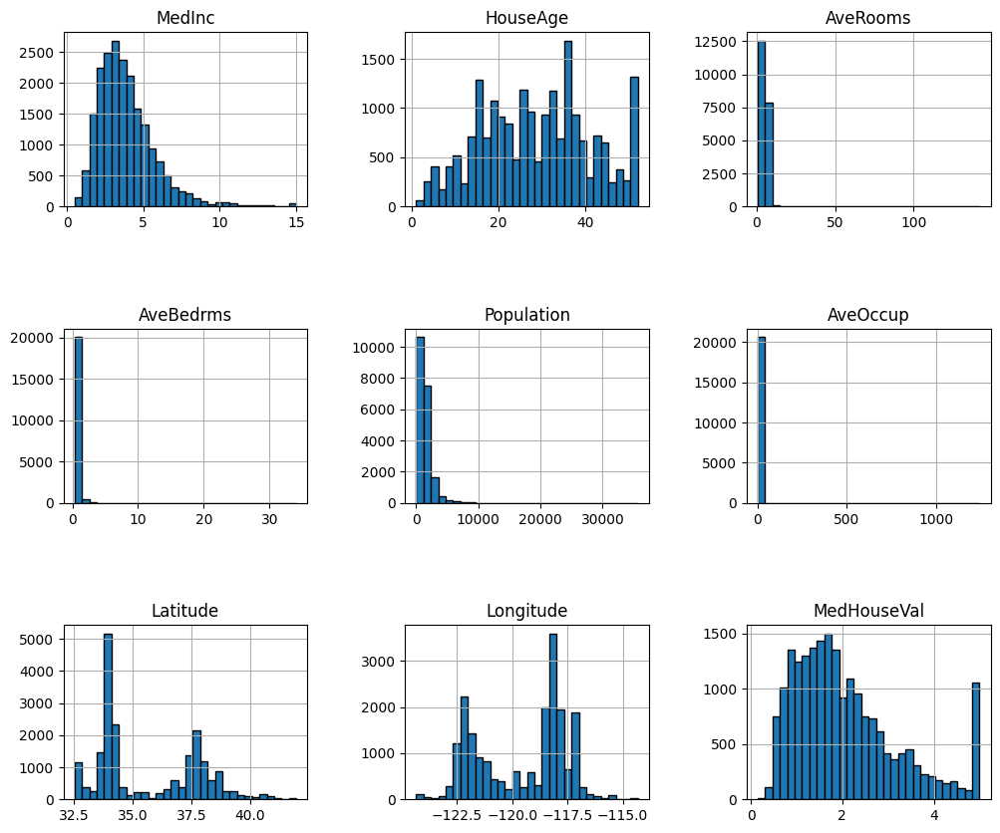

In [ ]:
import matplotlib.pyplot as plt

housing.frame.hist(figsize=(12, 10), bins=30, edgecolor="black")
plt.subplots_adjust(hspace=0.7, wspace=0.4)

In [ ]:
features_of_interest = ["AveRooms", "AveBedrms", "AveOccup", "Population"]
housing.frame[features_of_interest].describe()

,AveRooms,AveBedrms,AveOccup,Population
count,20640.000000,20640.000000,20640.000000,20640.000000
mean,5.429000,1.096675,3.070655,1425.476744
std,2.474173,0.473911,10.386050,1132.462122
min,0.846154,0.333333,0.692308,3.000000
25%,4.440716,1.006079,2.429741,787.000000
50%,5.229129,1.048780,2.818116,1166.000000
75%,6.052381,1.099526,3.282261,1725.000000
max,141.909091,34.066667,1243.333333,35682.000000


## <font color="red">Exploratory Data Analysis</font>

- Important step before training the model.
- We use statistical analysis and visualizations to understand the relationship of the target variable with other features.

![fig_EDA](https://cdn-images-1.medium.com/max/1200/1*3sr-fMg4S_yEncGsIjyG9A.png)

### <font color="blue">STEP 1: Description of Data</font>

#### Quick Overview of the Data

In [ ]:
housing_pd

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,PRICE
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422
...,...,...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09,0.781
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21,0.771
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22,0.923
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32,0.847


#### Descriptive Statistics
- A helpful way to understand characteristics of the data and to get a quick summary of it.
- Provide basic statistical computations on the dataset like extreme values, count of data points, maximum value, minimum value, mean, standard deviation, etc.
- Any missing value or NaN value is automatically skipped.

In [ ]:
housing_pd.describe(include='all').transpose()

,count,mean,std,min,25%,50%,75%,max
MedInc,20640.0,3.870671,1.899822,0.499900,2.563400,3.534800,4.743250,15.000100
HouseAge,20640.0,28.639486,12.585558,1.000000,18.000000,29.000000,37.000000,52.000000
AveRooms,20640.0,5.429000,2.474173,0.846154,4.440716,5.229129,6.052381,141.909091
AveBedrms,20640.0,1.096675,0.473911,0.333333,1.006079,1.048780,1.099526,34.066667
Population,20640.0,1425.476744,1132.462122,3.000000,787.000000,1166.000000,1725.000000,35682.000000
AveOccup,20640.0,3.070655,10.386050,0.692308,2.429741,2.818116,3.282261,1243.333333
Latitude,20640.0,35.631861,2.135952,32.540000,33.930000,34.260000,37.710000,41.950000
Longitude,20640.0,-119.569704,2.003532,-124.350000,-121.800000,-118.490000,-118.010000,-114.310000
PRICE,20640.0,2.068558,1.153956,0.149990,1.196000,1.797000,2.647250,5.000010


We can use the method `value_counts` to get count of each category in a categorical attributed series of values.

In [ ]:
housing_pd.PRICE.value_counts()

,count
PRICE,
5.00001,965
1.37500,122
1.62500,117
1.12500,103
1.87500,93
...,...
0.34200,1
0.46200,1
3.52000,1


We can obtain the number of unique elements in each column.

In [ ]:
print(housing_pd.nunique())

MedInc        12928
HouseAge         52
AveRooms      19392
AveBedrms     14233
Population     3888
AveOccup      18841
Latitude        862
Longitude       844
PRICE          3842
dtype: int64


### <font color="blue">STEP 2: Dealing with Missing Data </font>

- Missing values in the dataset refer to those fields which are empty or no values assigned to them, these usually occur due to data entry errors, faults that occur with data collection processes.
- They need to be handled carefully because they reduce the quality of the data.
- They can lead to wrong prediction or classification and can also cause a high bias for any given model being used.
- It is a good practice to see if there are any missing values in the data.
- The way to handle missing values depends on the nature of our data and the missing values. Techniques may include:
     + Drop NULL or missing values
     + Fill Missing Values
     + Predict Missing values with an ML Algorithm

**Display Rows with Missing Data**

In [ ]:
housing_pd[housing_pd.isnull().any(axis=1)]

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,PRICE


**Count the number of missing values for each column**

In [ ]:
housing_pd.isnull().sum()

,0
MedInc,0
HouseAge,0
AveRooms,0
AveBedrms,0
Population,0
AveOccup,0
Latitude,0
Longitude,0
PRICE,0


In [ ]:
total = housing_pd.isnull().sum().sort_values(ascending=False)
percent = (housing_pd.isnull().sum()/housing_pd.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1,
                         keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
MedInc,0,0.0
HouseAge,0,0.0
AveRooms,0,0.0
AveBedrms,0,0.0
Population,0,0.0
AveOccup,0,0.0
Latitude,0,0.0
Longitude,0,0.0
PRICE,0,0.0


We can also count the number of non-missing data:

In [ ]:
housing_pd.notna().sum()

,0
MedInc,20640
HouseAge,20640
AveRooms,20640
AveBedrms,20640
Population,20640
AveOccup,20640
Latitude,20640
Longitude,20640
PRICE,20640


#### Drop NULL or Missing Values
- Fastest and easiest step to handle missing values.
- Not generally advised for it can deteriorate the quality of the model as it reduces sample size because it works by deleting all other observations where any of the variables is missing.

In [ ]:
housing_pd.shape

(20640, 9)

#### Predict the Missing Values with a ML Algorithm
- Best and most efficient methods for handling missing data.
- Depending on the class of data that is missing, one can either use a regression or classification model to predict missing data.

### <font color="blue">STEP 3: Handling Outliers </font>

- An outlier is something which is separate or different from the crowd.
- Outliers can be a result of a mistake during data collection or it can be just an indication of variance in your data.
- It is wise to be correct or remove any outlier from the data before calculating summary statistics or deriving insights from the data.
- Failing to properly handle outliers might lead to incorrect analysis.
- For detecting and handling outliers, we can consider the following techniques:
     + Scatterplot
     + BoxPlot
     + IQR (Inter-Quartile Range)

#### BoxPlot
- Pictorial representation of distribution of data which shows extreme values, median and quartiles.
- Boxplots show robust measures of location and spread as well as providing information about symmetry and outliers.
    + The range of the data provides us with a measure of spread and is equal to a value between the smallest data point (min) and the largest one (Max)
    + The interquartile range (IQR), which is the range covered by the middle 50% of the data.
    + IQR = Q3 – Q1, the difference between the third and first quartiles. The first quartile (Q1) is the value such that one quarter (25%) of the data points fall below it, or the median of the bottom half of the data. The third quartile is the value such that three quarters (75%) of the data points fall below it, or the median of the top half of the data.
    + The IQR can be used to detect outliers using the 1.5(IQR) criteria. Outliers are observations that fall below Q1 – 1.5(IQR) or above Q3 + 1.5(IQR).

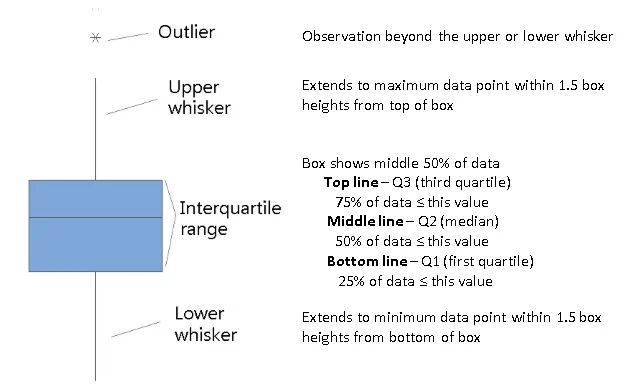


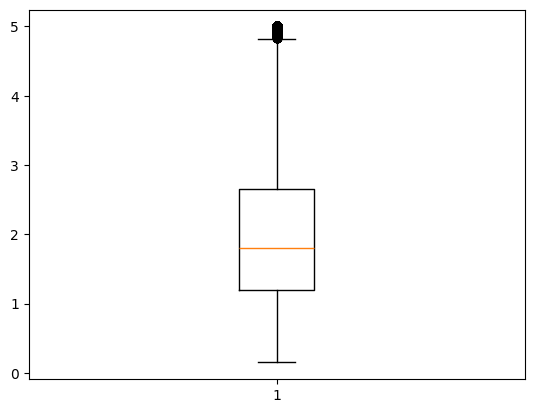

In [ ]:
plt.boxplot(list(housing_pd.PRICE));
plt.show();

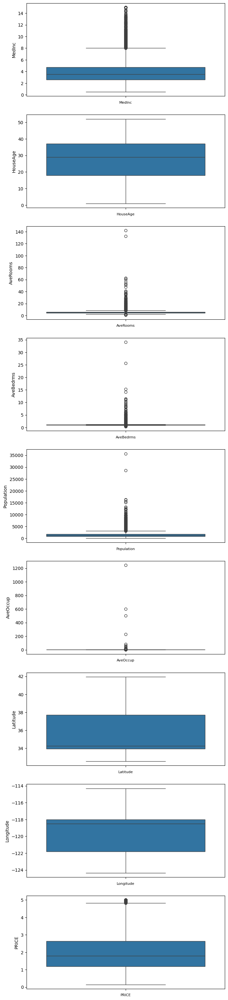

In [ ]:
fig,  ax = plt.subplots(len(list(housing_pd.columns)), figsize=(8,40))

for i, feature_name in enumerate(list(housing_pd.columns)):
    sns.boxplot(y=housing_pd[feature_name], ax=ax[i]);
    ax[i].set_xlabel(feature_name, fontsize=8);
    #ax[i].set_title("Box plot {} ".format(feature_name), fontsize=8);

plt.show();

#### Scatterplot
- A mathematical diagram using Cartesian coordinates to display values for two variables for a set of data.
- The data are displayed as a collection of points, each having the value of one variable determining the position on the horizontal axis and the value of the other variable determining the position on the vertical axis.
- **The points that are far from the population can be termed as an outlier.**

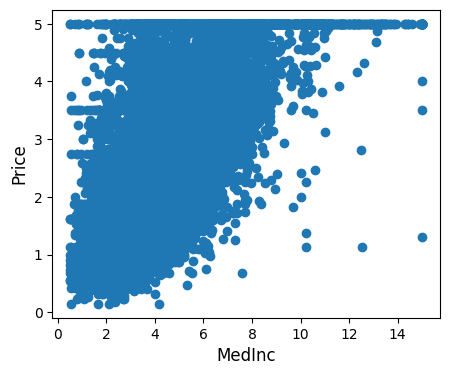

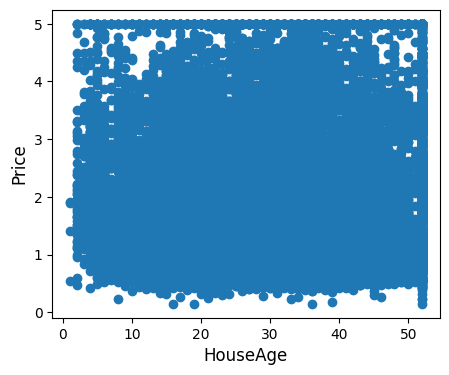

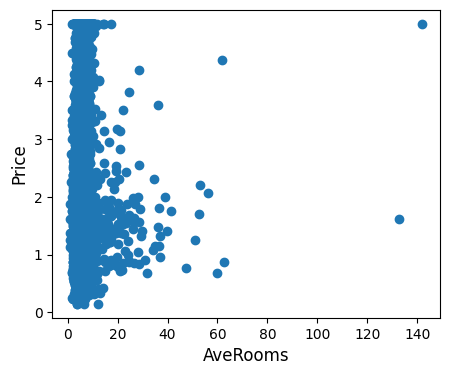

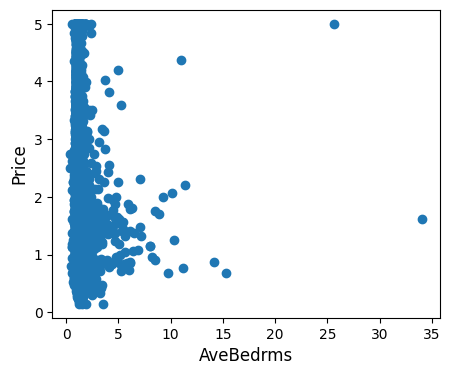

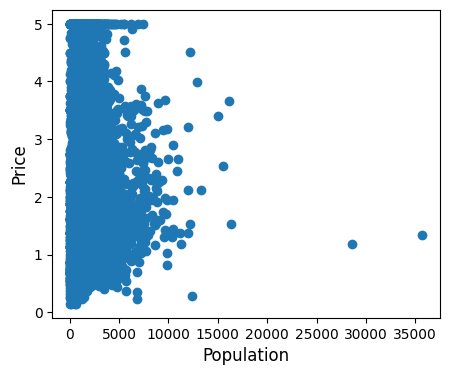

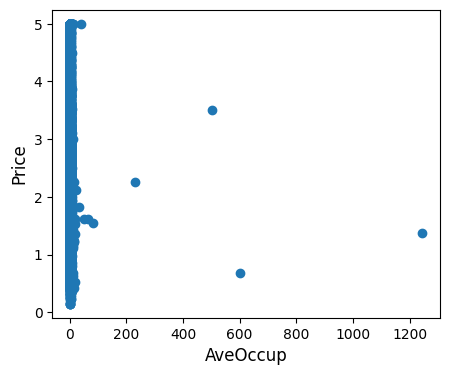

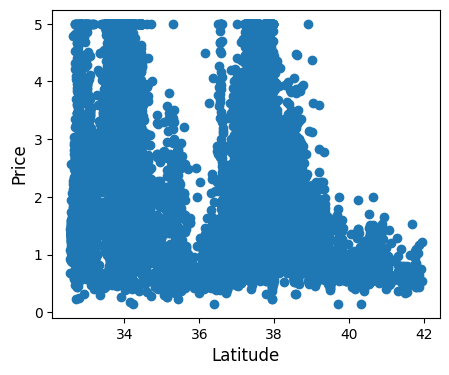

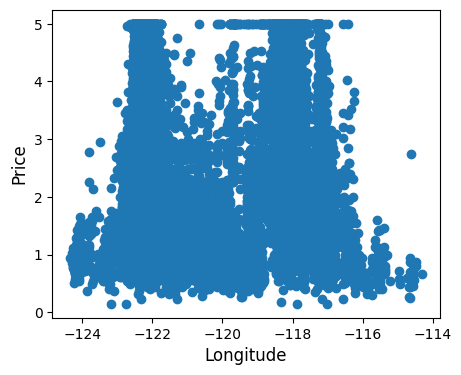

In [ ]:
for feature_name in housing.feature_names:
    plt.figure(figsize=(5, 4));
    plt.scatter(housing_pd[feature_name], housing_pd['PRICE']);
    plt.ylabel('Price', size=12);
    plt.xlabel(feature_name, size=12);

plt.show();

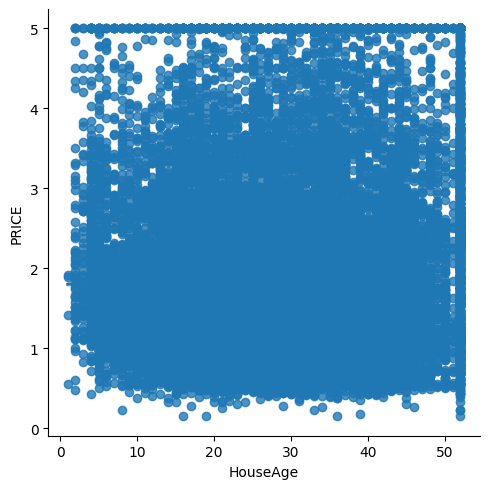

In [ ]:
sns.lmplot(x = 'HouseAge', y = 'PRICE', data = housing_pd)

#### IQR
- The interquartile range (IQR) is a measure of statistical dispersion, being equal to the difference between 75th and 25th percentiles, or between upper and lower quartiles.
- **IQR = Q3 - Q1**

In [ ]:
Q1 = housing_pd.quantile(0.25)
Q3 = housing_pd.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

MedInc          2.179850
HouseAge       19.000000
AveRooms        1.611665
AveBedrms       0.093447
Population    938.000000
AveOccup        0.852520
Latitude        3.780000
Longitude       3.790000
PRICE           1.451250
dtype: float64


Once we have IQR scores below code will remove all the outliers in our dataset.

In [ ]:
housing_outlier_IQR = housing_pd[~((housing_pd < (Q1 - 1.5 * IQR)) |
                                 (housing_pd > (Q3 + 1.5 * IQR))).any(axis=1)]
housing_outlier_IQR.shape

(16312, 9)

### <font color="blue">Understanding Relationships and New Insights Through Plots

#### Histogram
- Great tool for quickly assessing a probability distribution that is easy for interpretation.

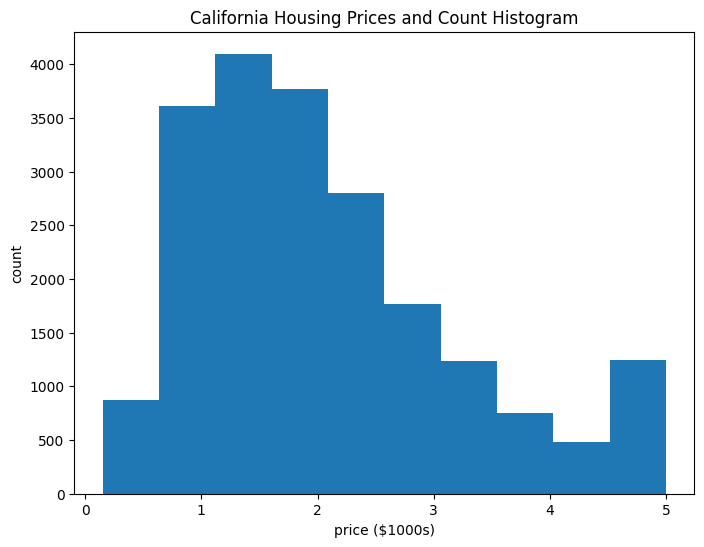

In [ ]:
plt.figure(figsize=(8, 6));
plt.hist(housing_pd['PRICE']);
plt.title('California Housing Prices and Count Histogram');
plt.xlabel('price ($1000s)');
plt.ylabel('count');
plt.show();

/tmp/ipython-input-3075698801.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(housing_pd['PRICE'], fit=stats.norm);


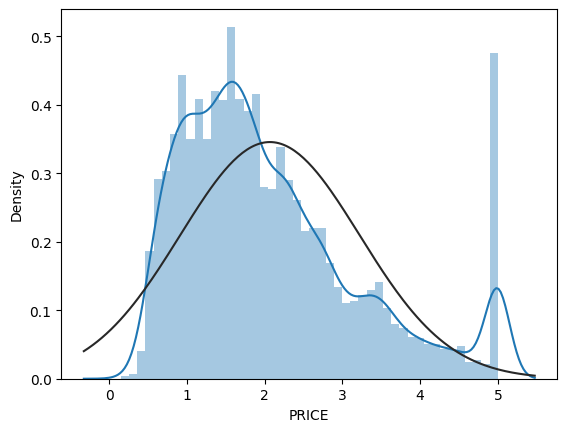

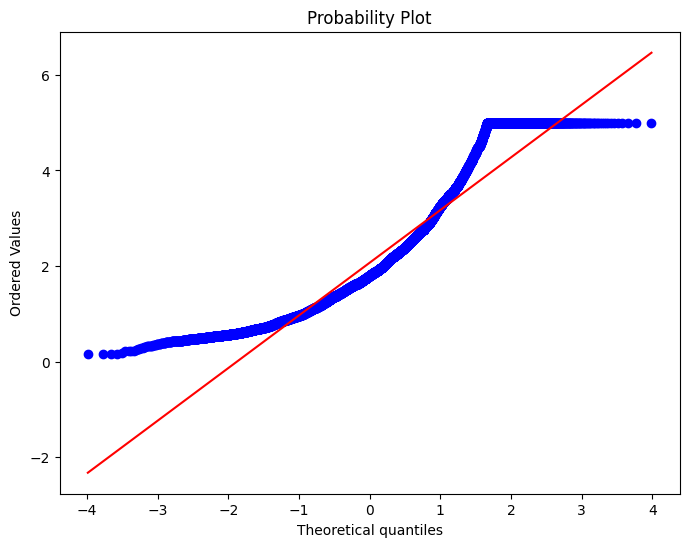

In [ ]:
from scipy.stats import norm
sns.distplot(housing_pd['PRICE'], fit=stats.norm);
plt.figure(figsize=(8, 6));
res = stats.probplot(housing_pd['PRICE'], plot=plt);

From the above output we can see that the values of PRICE is normally distributed with some of the outliers.

Plot (histograms and the estimated PDF) the univariate distribution of the columns.

/tmp/ipython-input-2417342338.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(housing_pd[feature_name], hist=True, ax=ax[i]);
/tmp/ipython-input-2417342338.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(housing_pd[feature_name], hist=True, ax=ax[i]);
/tmp/ipython-input-2417342338.py:5: 

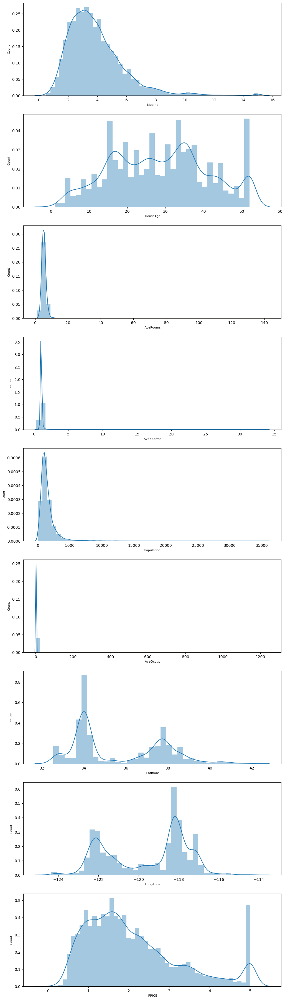

In [ ]:
fig,  ax = plt.subplots(len(list(housing_pd.columns)), figsize=(12,46))

for i, feature_name in enumerate(list(housing_pd.columns)):
    if (feature_name != 'CHAS'):
       sns.distplot(housing_pd[feature_name], hist=True, ax=ax[i]);
       ax[i].set_ylabel('Count', fontsize=8);
       ax[i].set_xlabel(" {}".format(feature_name), fontsize=8);
       #ax[i].set_title("Freq dist "+feature_name, fontsize=8);

plt.show();

The bivariate distribution plots help us to study the relationship between two variables by analyzing the scatter plot.

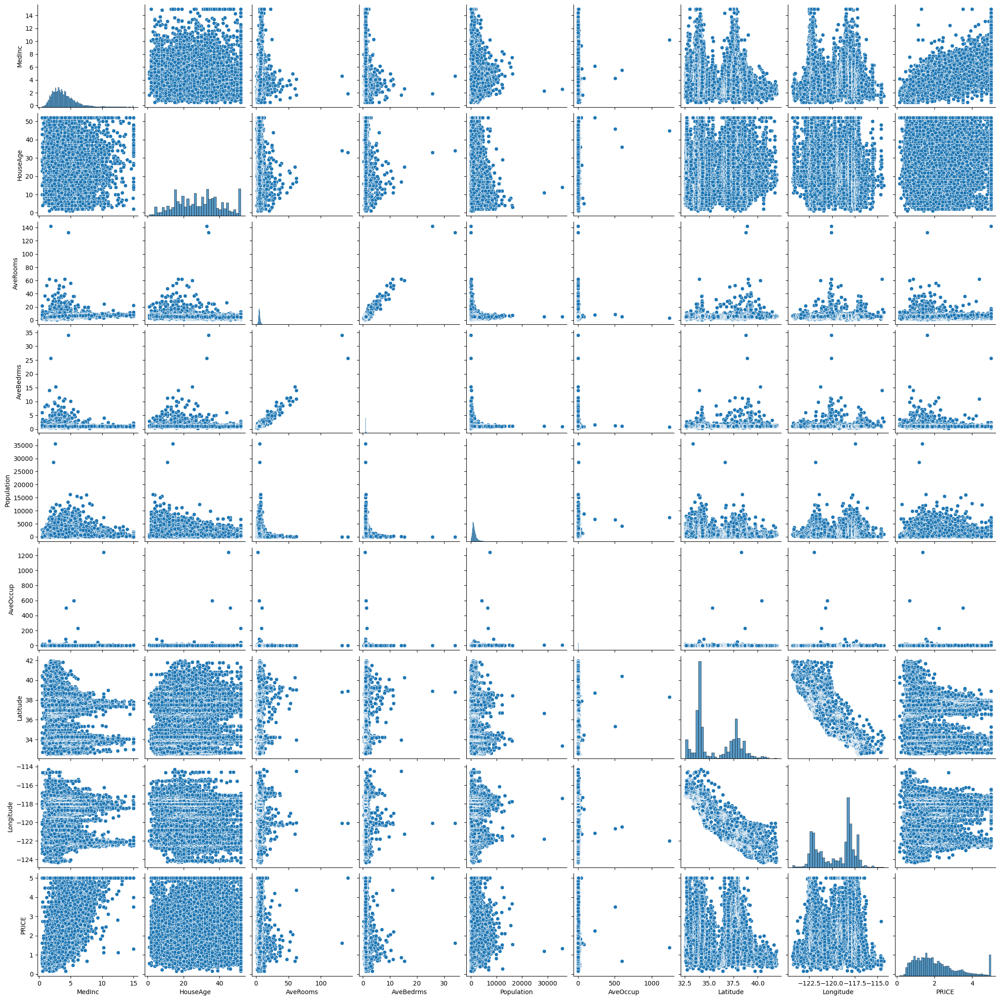

In [ ]:
sns.pairplot(housing_pd);

You can select a few features:

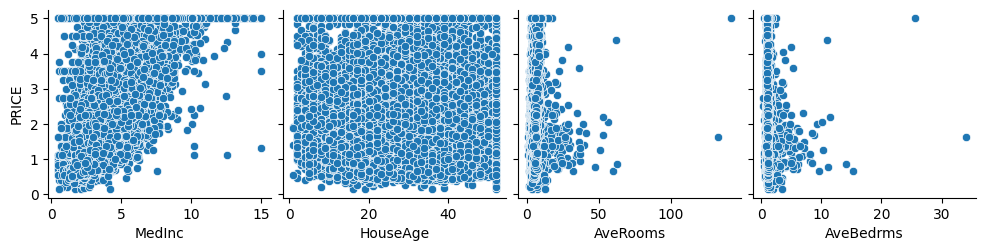

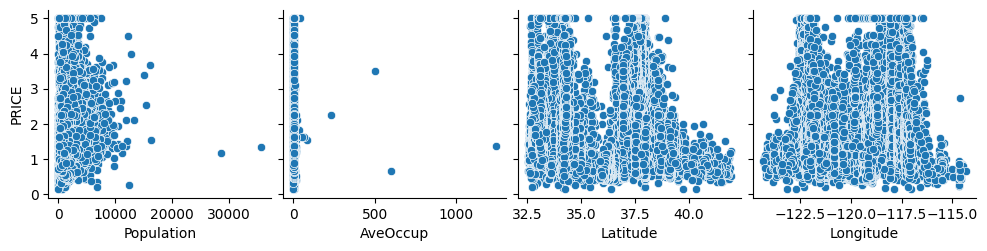

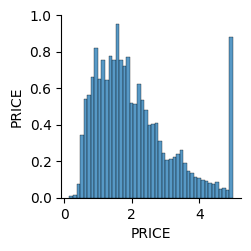

In [ ]:
n = 4
for i in range(0, len(housing_pd.columns), n):
    sns.pairplot(data=housing_pd,
                x_vars=housing_pd.columns[i:i+n],
                y_vars=['PRICE']);

#### Heatmap: Two-Dimensional Graphical Representation
- Represent the individual values that are contained in a matrix as colors.
- Create a correlation matrix that measures the linear relationships between the variables.
- The pairs which are highly correlated represent the same variance of the dataset thus we can further analyze them to understand which attribute among the pairs are most significant for building the model.
- A number on the map indicates a strong inverse relationship, no relationship, and a strong direct relationship, respectively.

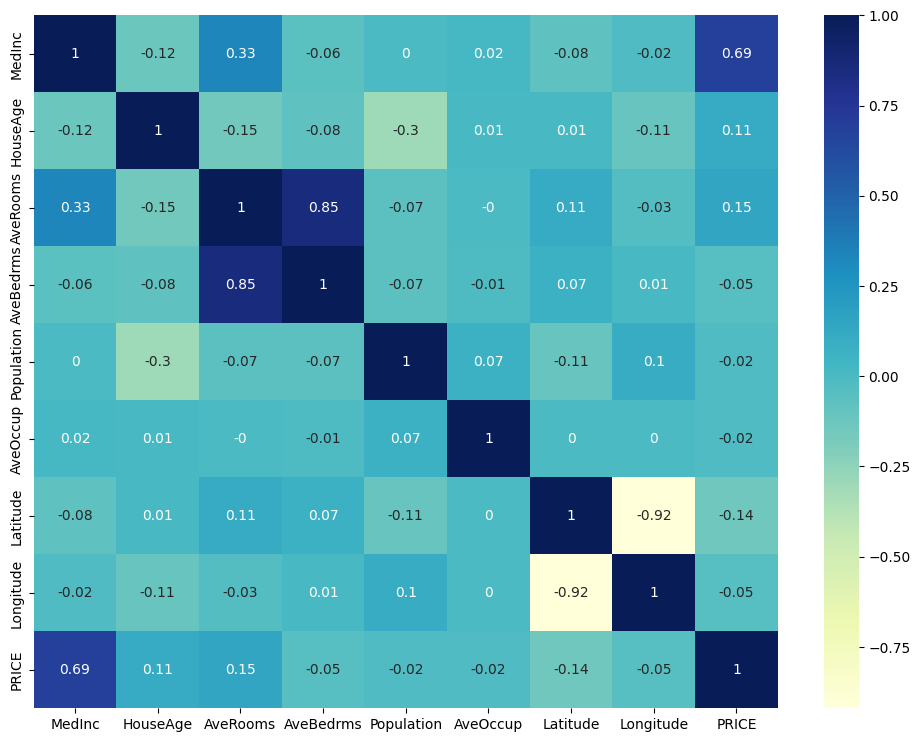

In [ ]:
plt.figure(figsize=(12, 9));
correlation_matrix = housing_pd.corr().round(2);
sns.heatmap(correlation_matrix, cmap="YlGnBu", annot=True);

You may choose to select only correlations that verify specific conditions:

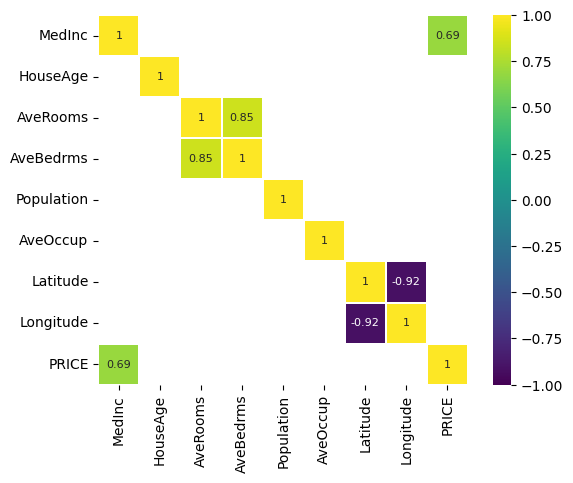

In [ ]:
sns.heatmap(correlation_matrix[(correlation_matrix >= 0.5) | (correlation_matrix <= -0.4)],
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 8}, square=True);

**You can also calculate the correlation between individual features and PRICE:**

In [ ]:
import operator

individual_features_df = []
for i in range(0, len(housing_pd.columns) - 1): # -1 because the last column is PRICE
    tmpDf = housing_pd[[housing_pd.columns[i], 'PRICE']]
    individual_features_df.append(tmpDf)

all_correlations = {feature.columns[0]: feature.corr()['PRICE'][0] for feature in individual_features_df}
all_correlations = sorted(all_correlations.items(), key=operator.itemgetter(1))
for (key, value) in all_correlations:
    print("{:>15}: {:>15}".format(key, value))

       Latitude: -0.14416027687465632
      AveBedrms: -0.046700512969486685
      Longitude: -0.04596661511798309
     Population: -0.02464967888889485
       AveOccup: -0.023737412956134355
       HouseAge: 0.10562341249321128
       AveRooms: 0.15194828974145738
         MedInc: 0.6880752079585484


/tmp/ipython-input-1615741128.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  all_correlations = {feature.columns[0]: feature.corr()['PRICE'][0] for feature in individual_features_df}


**You can select which feautures you might consider for your model:**

In [ ]:
golden_features_list = [key for key, value in all_correlations if abs(value) >= 0.5]
n = len(golden_features_list)
print("There is {} strongly correlated values with PRICE:".format(n))
for var in golden_features_list:
    print("\t {}".format(var))

There is 1 strongly correlated values with PRICE:
	 MedInc


# <font color="red">Use Pandas Profiling</font>
- Simple and fast EDA of a Pandas dataframe
- Automatically perform operations such as:
     + boxplot and histogram for a continous variable
     + Measure missing values
     + Calculate frequency if it's categorical variable
- Generate an interactive HTML report containing statistical data on each feature.



In [ ]:
pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


----

In [ ]:
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport

In [ ]:
df = pd.read_csv('sample_data/california_housing_train.csv', na_values=-1)
report = ProfileReport(df, title='Exercise Report')
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 9/9 [00:00<00:00, 51.19it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## <font color="red">Exercise</font>

Visit the <a href="https://archive.ics.uci.edu/ml/datasets.php">UCI Machine Learning Repository</a> or the <a href="http://www.ee.columbia.edu/~cylin/course/bigdata/getdatasetinfo.html">Columbia University Big Data Analytics</a> to select a dataset you want to perform EDA on.

An alternative is to Perform EDA on the automobile price dataset which description is available at the <a href="https://archive.ics.uci.edu/ml/datasets/automobile">UCI Machine Learning Repository</a>.
- You may want to follow the link: <a href="https://www.kaggle.com/toramky/eda-for-automobile-dataset">kaggle.com</a>

In [ ]:
url = 'https://raw.githubusercontent.com/StephenElston/ExploringDataWithPython/master/PlottingWithPytonTools/Automobile%20price%20data.csv'
import pandas as pd
automobile = pd.read_csv(url)

----